In [1]:
from Functions_MCMC_for_GP import *

### Test Metropolis

Acceptance rate:  0.8393636363636363


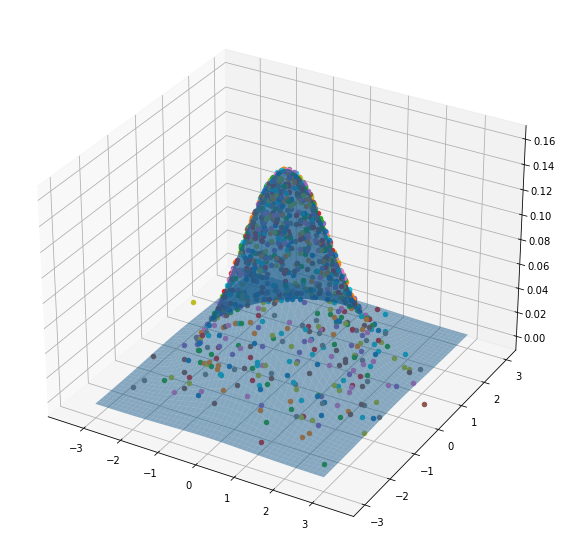

In [2]:
# test Metropolis
def target(x):
    # normal distribution
    return multivariate_normal(mean=[0, 0], cov=np.eye(2)).pdf(x)

cov = np.eye(2)*0.1
x0 = np.array([0, 0])
n_sample = 1000
burn_in = 1000
thinning = 10
sample,all_samples = Metropolis(n_sample, cov, x0, burn_in, thinning, target=target)

# plot in 3D
fig = plt.figure(figsize=(10, 10))
ax = fig.add_subplot(111, projection='3d')
for i in range(n_sample):
    ax.scatter(sample[0, i], sample[1, i], target(sample[:, i]))
# real distribution
x = np.linspace(-3, 3, 100)
y = np.linspace(-3, 3, 100)
X, Y = np.meshgrid(x, y)
Z = np.zeros_like(X)
for i in range(len(x)):
    for j in range(len(y)):
        Z[i, j] = target([X[i, j], Y[i, j]])
ax.plot_surface(X, Y, Z, alpha=0.5)
plt.show()

In [3]:
x1 = [all_samples[i][0] for i in range(len(all_samples))]
x2 = [all_samples[i][1] for i in range(len(all_samples))]

plot_chain(x1,burnin=burn_in/(thinning*n_sample+burn_in))
plot_chain(x2,burnin=burn_in/(thinning*n_sample+burn_in))

### Test Vihola

Acceptance rate:  0.7320833333333333


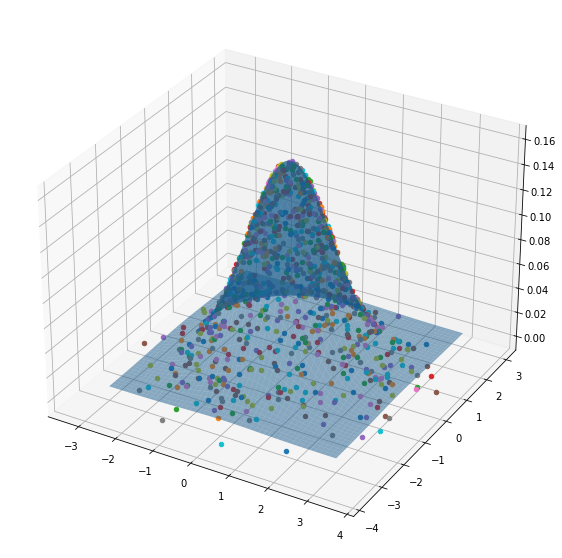

In [4]:
cov0 = np.eye(2)*0.1
x0 = np.array([0, 0])
n_sample = 1000
burn_in = 2000
thinning = 10
learnin_rate=0.5
alpha=0.7
sample,all_samples = Metropolis_vihola(n_sample, cov0, x0, burn_in, thinning, target=target, learnin_rate=learnin_rate, alpha=alpha)

# plot in 3D
fig = plt.figure(figsize=(10, 10))
ax = fig.add_subplot(111, projection='3d')
for i in range(n_sample):
    ax.scatter(sample[0, i], sample[1, i], target(sample[:, i]))
# real distribution
x = np.linspace(-3, 3, 100)
y = np.linspace(-3, 3, 100)
X, Y = np.meshgrid(x, y)
Z = np.zeros_like(X)
for i in range(len(x)):
    for j in range(len(y)):
        Z[i, j] = target([X[i, j], Y[i, j]])
ax.plot_surface(X, Y, Z, alpha=0.5)
plt.show()

In [5]:
x1 = [all_samples[i][0] for i in range(len(all_samples))]
x2 = [all_samples[i][1] for i in range(len(all_samples))]

plot_chain(x1,burnin=burn_in/(thinning*n_sample+burn_in))
plot_chain(x2,burnin=burn_in/(thinning*n_sample+burn_in))

### Test Vihola on a simulate GP hyper-hyperparemeters posterior

#### Case 1

In [6]:
def target(theta,prior,**kwargs):
    # simulate samples
    x=np.array([[0.1],[0.01]])
    y=np.array([0.8, 0.6])

    # normal distribution
    K = np.zeros((2, 2))
    for i in range(2):
        for j in range(2):
            # no negative s
            K[i, j] = kernel_M52(x[i], x[j], l=theta[1:], s=theta[0]+1e-6)
    posterior = multivariate_normal(mean=[1,1], cov=K).pdf(y)*prior(theta,bounds)

    return posterior

#add noise to the off-diagonal elements of the covariance matrix
#first is s and the rest are l
bounds = [[1e-6,20],[-10, 10]]
learnin_rate=0.5
alpha=0.7
cov0 = np.eye(2) 
theta0 = np.array([1,1])
n_sample = 1000
burn_in = 1000
thinning = 10
sample,all_samples = Metropolis_vihola(n_sample, cov, theta0, burn_in, thinning,learnin_rate=learnin_rate, alpha=alpha, target=target , prior=prior,bounds=bounds)

s = [all_samples[i][0] for i in range(len(all_samples))]
l = [all_samples[i][1] for i in range(len(all_samples))]

plot_chain(s,burnin=burn_in/(thinning*n_sample+burn_in))
plot_chain(l,burnin=burn_in/(thinning*n_sample+burn_in))

Acceptance rate:  0.7294545454545455


#### Case 2
Bounds: l:[-10, 10]

In [7]:
def target(theta,prior,**kwargs):
    # simulate samples
    x=np.array([[3],[4]])
    y=np.array([0.01,0.01])

    # normal distribution
    K = np.zeros((2, 2))
    for i in range(2):
        for j in range(2):
            # no negative s
            K[i, j] = kernel_M52(x[i], x[j], l=theta[1:], s=theta[0]+1e-6)
    posterior = multivariate_normal(mean=[1,1], cov=K).pdf(y)*prior(theta,bounds)

    return posterior

#add noise to the off-diagonal elements of the covariance matrix
#first is s and the rest are l
bounds = [[1e-6,20],[-10, 10]]
learnin_rate=0.5
alpha=0.7
cov0 = np.eye(2) 
theta0 = np.array([1,1])
n_sample = 1000
burn_in = 1000
thinning = 10
sample,all_samples = Metropolis_vihola(n_sample, cov, theta0, burn_in, thinning,learnin_rate=learnin_rate, alpha=alpha, target=target , prior=prior,bounds=bounds)

s = [all_samples[i][0] for i in range(len(all_samples))]
l = [all_samples[i][1] for i in range(len(all_samples))]

plot_chain(s,burnin=burn_in/(thinning*n_sample+burn_in))
plot_chain(l,burnin=burn_in/(thinning*n_sample+burn_in))

Acceptance rate:  0.738


Bounds: l:[-100, 100]

In [8]:
bounds = [[1e-6,20],[-100, 100]]
learnin_rate=0.5
sample,all_samples = Metropolis_vihola(n_sample, cov, theta0, burn_in, thinning,learnin_rate=learnin_rate, alpha=alpha, target=target , prior=prior,bounds=bounds)

l = [all_samples[i][1] for i in range(len(all_samples))]
plot_chain(l,burnin=burn_in/(thinning*n_sample+burn_in))

Acceptance rate:  0.7363636363636363


Bounds: l[-1000, 1000]

In [9]:
bounds = [[1e-6,20],[-1000, 1000]]
learnin_rate=0.5
sample,all_samples = Metropolis_vihola(n_sample, cov, theta0, burn_in, thinning,learnin_rate=learnin_rate, alpha=alpha, target=target , prior=prior,bounds=bounds)

l = [all_samples[i][1] for i in range(len(all_samples))]
plot_chain(l,burnin=burn_in/(thinning*n_sample+burn_in))

Acceptance rate:  0.736
